### Required Packages

In [188]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, \
    RobustScaler, Normalizer, MaxAbsScaler, PowerTransformer, QuantileTransformer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA, KernelPCA
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.ensemble import IsolationForest
from matplotlib import style
from scipy.cluster.hierarchy import dendrogram, linkage
import plotly.express as px

warnings.filterwarnings("ignore")
plt.style.use('Solarize_Light2')


### Read Data

In [189]:
data = pd.read_csv('Datasets/CC.csv', index_col='CUST_ID')

#### Edit Data Columns Naming

In [190]:
data.columns = data.columns.str.lower()
data.columns

Index(['balance', 'balance_frequency', 'purchases', 'oneoff_purchases',
       'installments_purchases', 'cash_advance', 'purchases_frequency',
       'oneoff_purchases_frequency', 'purchases_installments_frequency',
       'cash_advance_frequency', 'cash_advance_trx', 'purchases_trx',
       'credit_limit', 'payments', 'minimum_payments', 'prc_full_payment',
       'tenure'],
      dtype='object')

#### Show Data Types

In [191]:
data.dtypes

balance                             float64
balance_frequency                   float64
purchases                           float64
oneoff_purchases                    float64
installments_purchases              float64
cash_advance                        float64
purchases_frequency                 float64
oneoff_purchases_frequency          float64
purchases_installments_frequency    float64
cash_advance_frequency              float64
cash_advance_trx                      int64
purchases_trx                         int64
credit_limit                        float64
payments                            float64
minimum_payments                    float64
prc_full_payment                    float64
tenure                                int64
dtype: object

#### Data Size

In [192]:
data.shape

(8950, 17)

#### Data Summary

In [193]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8950 entries, C10001 to C19190
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   balance                           8950 non-null   float64
 1   balance_frequency                 8950 non-null   float64
 2   purchases                         8950 non-null   float64
 3   oneoff_purchases                  8950 non-null   float64
 4   installments_purchases            8950 non-null   float64
 5   cash_advance                      8950 non-null   float64
 6   purchases_frequency               8950 non-null   float64
 7   oneoff_purchases_frequency        8950 non-null   float64
 8   purchases_installments_frequency  8950 non-null   float64
 9   cash_advance_frequency            8950 non-null   float64
 10  cash_advance_trx                  8950 non-null   int64  
 11  purchases_trx                     8950 non-null   int64  
 12  cred

In [194]:
data.describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
balance,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
balance_frequency,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
purchases,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
oneoff_purchases,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
installments_purchases,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
cash_advance,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
purchases_frequency,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
oneoff_purchases_frequency,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
purchases_installments_frequency,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
cash_advance_frequency,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


> Note: Data Contains Missing Values

### Preprocess Data

#### Missing Values

In [195]:
data.isnull().sum().sort_values(ascending=False)

minimum_payments                    313
credit_limit                          1
balance                               0
cash_advance_frequency                0
prc_full_payment                      0
payments                              0
purchases_trx                         0
cash_advance_trx                      0
purchases_installments_frequency      0
balance_frequency                     0
oneoff_purchases_frequency            0
purchases_frequency                   0
cash_advance                          0
installments_purchases                0
oneoff_purchases                      0
purchases                             0
tenure                                0
dtype: int64

In [196]:
data.dropna(inplace=True)

In [197]:
data.isnull().sum().sort_values(ascending=False)

balance                             0
cash_advance_frequency              0
prc_full_payment                    0
minimum_payments                    0
payments                            0
credit_limit                        0
purchases_trx                       0
cash_advance_trx                    0
purchases_installments_frequency    0
balance_frequency                   0
oneoff_purchases_frequency          0
purchases_frequency                 0
cash_advance                        0
installments_purchases              0
oneoff_purchases                    0
purchases                           0
tenure                              0
dtype: int64

#### Duplicates Detection

In [198]:
data.duplicated().value_counts()

False    8636
dtype: int64

> Note: No Duplicate Data

### EDA

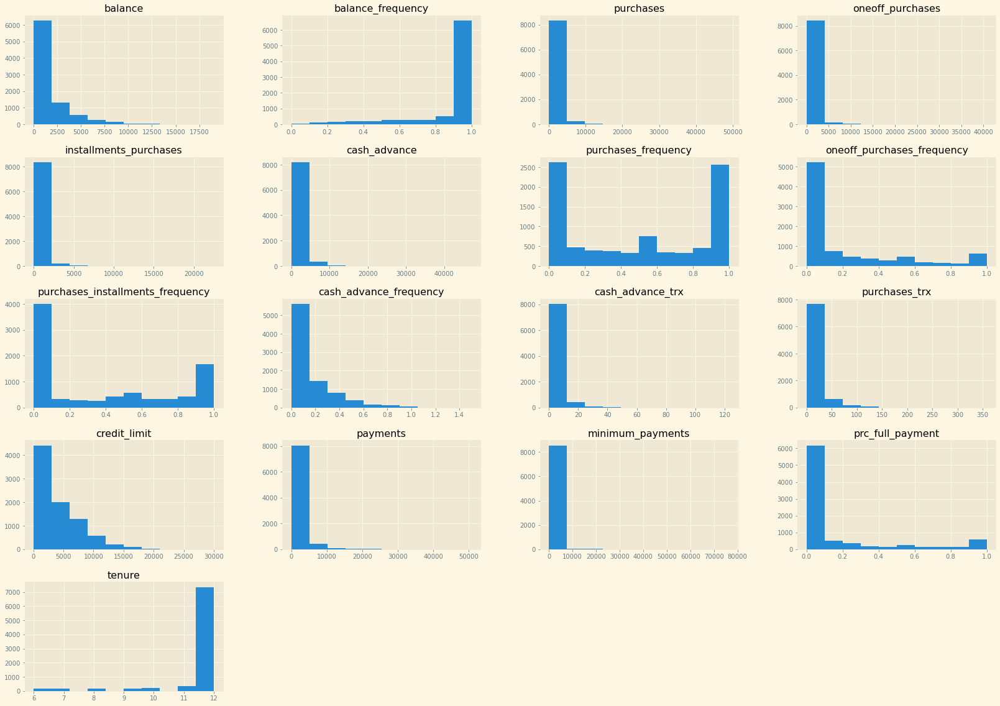

In [199]:
data.hist(figsize=(28,20))
plt.show()

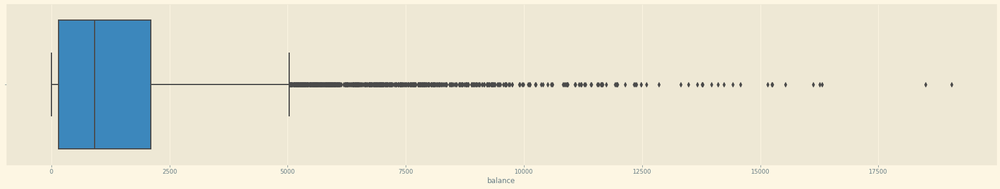

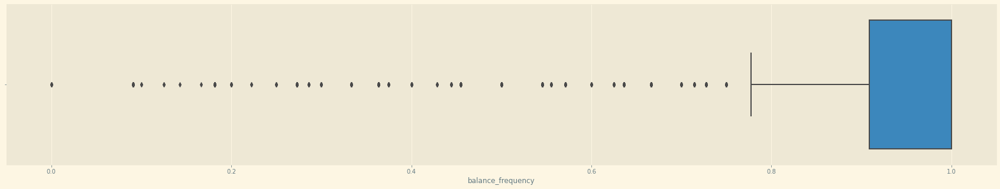

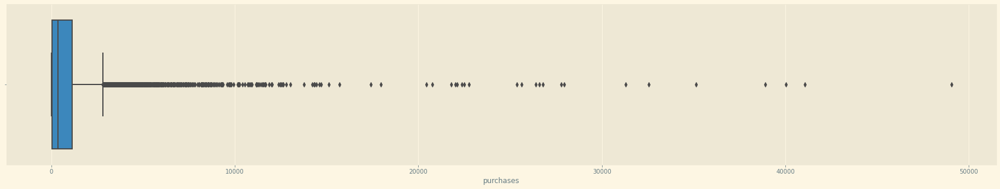

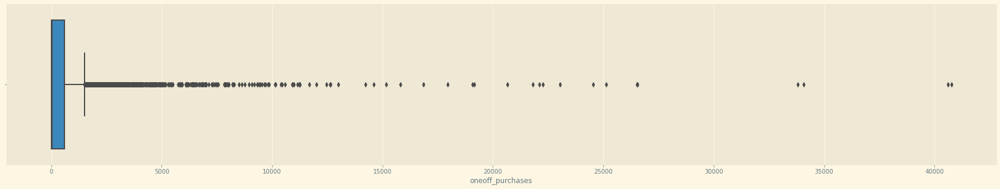

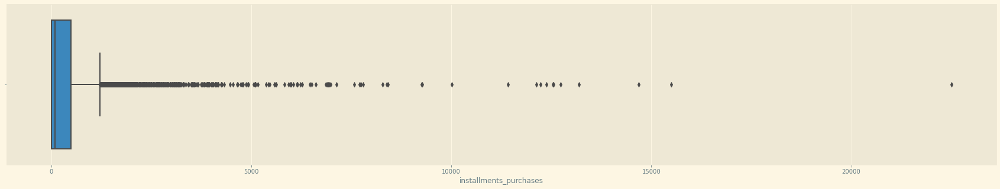

...

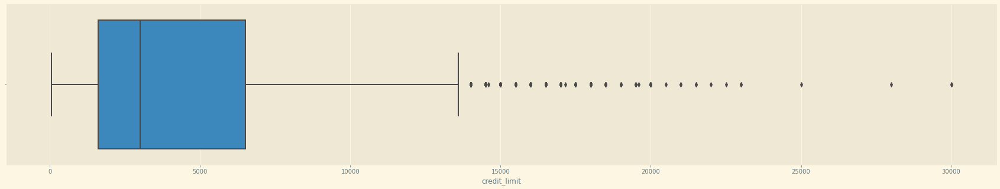

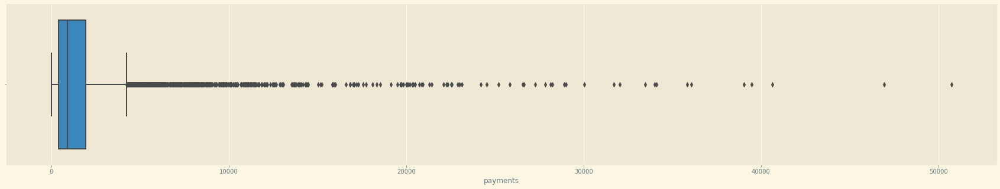

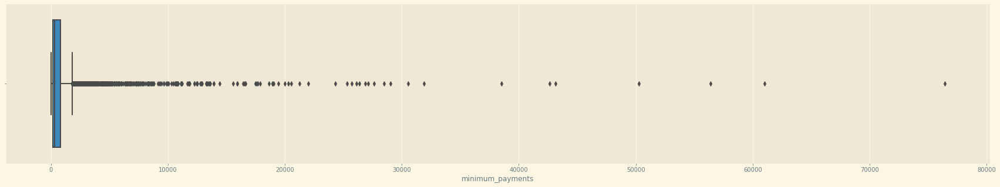

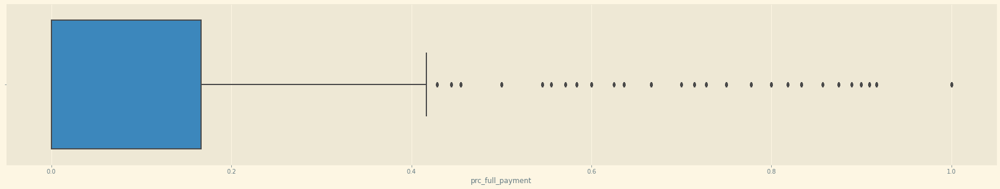

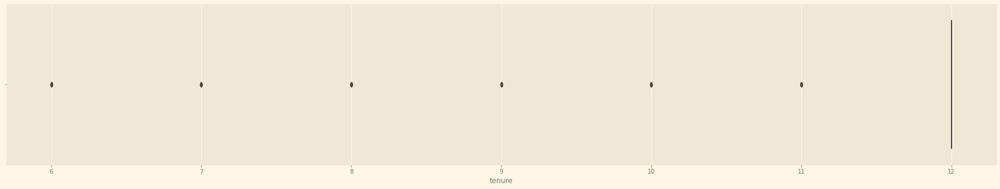

In [200]:
for column in data.columns:
    plt.figure(figsize = (30,5))
    sns.boxplot(data[column])
    plt.show()

### Scaling and Transformation

#### 1- Standard Scaler

In [201]:
sc = StandardScaler()
df_sc = data.copy()

Standard_scaler = pd.DataFrame(sc.fit_transform(df_sc), columns=data.columns)
Standard_scaler.to_csv("Standard_Scaler_data.csv")

#### 2- MinMax Scaler

In [202]:
mm = MinMaxScaler()
df_mm = data.copy()

min_max_scaler = pd.DataFrame(mm.fit_transform(df_mm), columns=data.columns)
min_max_scaler.to_csv("MinMax_Scaler_data.csv")

#### 3- Robust Scaler

In [203]:
rs = RobustScaler()
df_rs = data.copy()

Robust_scaler = pd.DataFrame(rs.fit_transform(df_rs), columns=data.columns)
Robust_scaler.to_csv("Robust_Scaler_data.csv")

#### 4- MaxAbs Scaler

In [204]:
ma = MaxAbsScaler()
df_ma = data.copy()

Max_Abs_scaler = pd.DataFrame(ma.fit_transform(df_ma), columns=data.columns)
Max_Abs_scaler.to_csv("Max_Abs_Scaler_data.csv")

#### 5- Normalizer

In [205]:
normalizer = Normalizer()
df_nm = data.copy()

nzr = pd.DataFrame(normalizer.fit_transform(df_nm), columns=data.columns)
nzr.to_csv("Normalizer_data.csv")

#### 6- Quantile Transformer

In [206]:
QT = QuantileTransformer()
df_qt = data.copy()

qt = pd.DataFrame(QT.fit_transform(df_qt), columns=data.columns)
qt.to_csv("Quantile_Transformer_data.csv")

#### 7- Power Transformer

In [207]:
PT = PowerTransformer()
df_pt = data.copy()

pt = pd.DataFrame(PT.fit_transform(df_pt), columns=data.columns)
pt.to_csv("Power_Transformer_data.csv")

### Comment Transformation

#### 1- Standard Scaler

- StandardScaler removes the mean and scales the data to unit variance
- the outliers have an influence when computing the empirical mean and standard deviation

#### 2- Min Max Scaler

- rescales the data set such that all feature values are in the range [0, 1]
- also sensitive to the outliers

#### 3- Robust Scaler

- the centering and scaling statistics of RobustScaler is based on percentiles
- Not Influenced by outliers
- has larger range than other pervious scalers

#### 4- Max Abs Scaler

- Suffers from Outliers
- Positive Range [0, 1]

#### 5- Quantile Transformer

- a non-linear transformation
- mapping to a uniform or Gaussian distribution
- If all the data, including outliers, mapping to a uniform distribution with the range [0, 1], making outliers indistinguishable from inliers.
- 

#### 6- Power Transformer

- applies a power transformation to each feature to make the data more Gaussian
- minimize skewness
- Influenced by large outliers

#### 7- Normalizer

- rescales the vector for each sample to have unit norm
- have only positive values; therefore the transformed data only lie in the positive quadrant

### Our Next Steps
- Work with Robust Scaler and Quantile Transformer as Data has Outliers
- Run PCA and Kernal PCA
- DBSCAN, Kmeans, Heir. Clustering, EM and Isolated Random Forest
- Showing Result using t-SNE Visualization 
- Silhoutte Score 
- Commenting and determining best Algorithm for our problem

#### **Step One:** Read 2 preprocessed datasets 

##### 1- Robust Scaled Data 

In [208]:
robust_df = pd.read_csv('Robust_Scaler_data.csv', index_col=None)
robust_df = robust_df.iloc[:, 1:]

##### 2- Quantile Transformed Data

In [209]:
quantile_df = pd.read_csv('Quantile_Transformer_data.csv', index_col=None)
quantile_df = quantile_df.iloc[:, 1:]


#### **Step Two:** Apply PCA and Kernal PCA

##### A- PCA

In [210]:
pca = PCA()

##### A-1 Robust

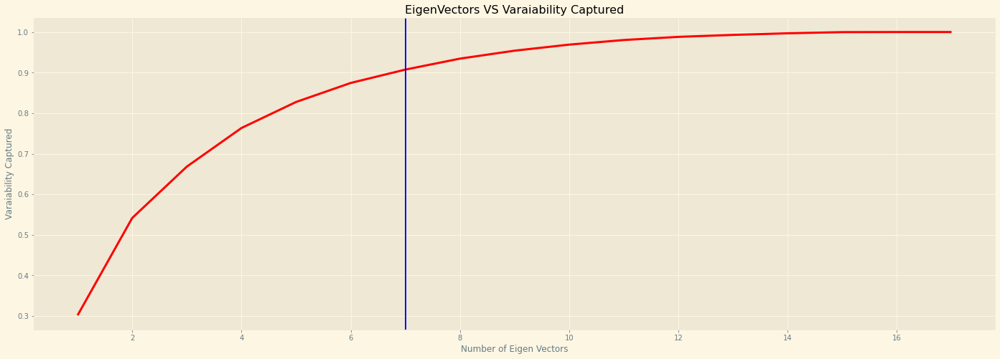

In [211]:
df_robust_pca = pca.fit_transform(robust_df)

d = {'Number of EigenVector': np.arange(1,len(df_robust_pca.T)+1), 'Varaiability Captured': np.cumsum(pca.explained_variance_ratio_)}
df = pd.DataFrame(data=d)

plt.figure(figsize=(24, 8))
plt.plot(df['Number of EigenVector'], df['Varaiability Captured'], linewidth=3, linestyle=None, color="red")
plt.title('EigenVectors VS Varaiability Captured')
plt.xlabel("Number of Eigen Vectors")
plt.ylabel("Varaiability Captured")

# Added After Visualizing n_components equal to 6, 7
plt.axvline(x=7, color="blue")
plt.show()


> So For PCA and Kernal PCA: Set n_components to 6 or 7

In [212]:
pca = PCA(n_components=7)
kpca = KernelPCA(n_components = 7,kernel='rbf',gamma=0.03)

##### Apply PCA and Kernal PCA

In [213]:
df_robust_pca = pca.fit_transform(robust_df)
df_robust_kpca = kpca.fit_transform(robust_df)

##### A-2 Quantile

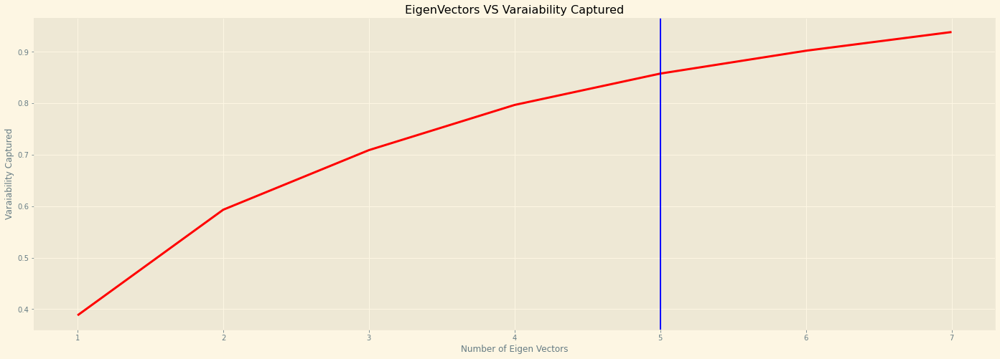

In [214]:
df_quantile_pca = pca.fit_transform(quantile_df)

d = {'Number of EigenVector': np.arange(1,len(df_quantile_pca.T)+1), 'Varaiability Captured': np.cumsum(pca.explained_variance_ratio_)}

df = pd.DataFrame(data=d)

plt.figure(figsize=(24, 8))
plt.plot(df['Number of EigenVector'], df['Varaiability Captured'], linewidth=3, linestyle=None, color="red")
plt.title('EigenVectors VS Varaiability Captured')
plt.xlabel("Number of Eigen Vectors")
plt.ylabel("Varaiability Captured")
# Added After Visualizing n_components equal to 4, 5
plt.axvline(x=5, color="blue")
plt.show()

##### Apply PCA and Kernal PCA

In [215]:
pca = PCA(n_components=5)
kpca = KernelPCA(n_components=5 ,kernel='rbf',gamma=0.03)

In [216]:
df_quantile_pca = pca.fit_transform(quantile_df)
df_quantile_kpca = kpca.fit_transform(quantile_df)

##### KNN

In [217]:
def Knn(data):
    mins = 5
    knn = NearestNeighbors(mins + 1)

    knn.fit(data)

    distances, neighbors = knn.kneighbors(data)

    distances = np.sort(distances[:, mins], axis = 0)
    
    return distances

##### Apply KNN on Robust and Quantile Data

In [218]:
robust_distances_pca = Knn(df_robust_pca)
robust_distances_kpca = Knn(df_robust_kpca)

quantile_distances_pca = Knn(df_quantile_pca)
quantile_distances_kpca = Knn(df_quantile_kpca)

##### Epsilon Line Plot

In [219]:
def plot_distances(distances, flag, linex):
    distances_df = pd.DataFrame({"distances": distances, "index": list(range(0,len(distances)))})
    plt.plot(distances_df['index'], distances_df['distances'], color="red", linewidth=3, linestyle=None)
    if flag==1:
        plt.title("Elbow Method for Choosing eps for Robust PCA")
        plt.axhline(y=linex)
    elif flag==2:
        plt.title("Elbow Method for Choosing eps for Robust KPCA")
    elif flag==3:
        plt.title("Elbow Method for Choosing eps for Quantile PCA")
    elif flag==4:
        plt.title("Elbow Method for Choosing eps for Quantile KPCA")
    plt.axhline(y=linex)
    plt.show()

##### Robust PCA and KPCA

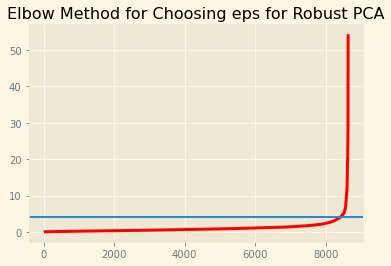

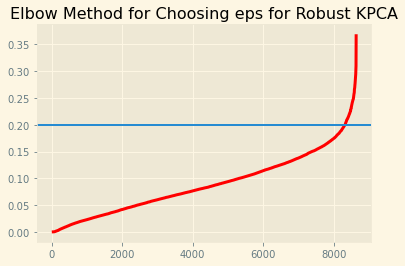

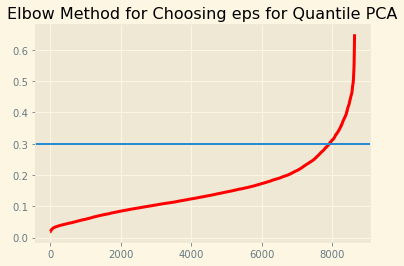

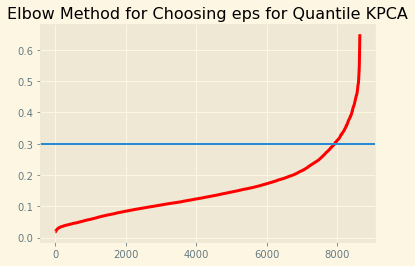

In [220]:
plot_distances(robust_distances_pca, 1, 4)
plot_distances(robust_distances_kpca, 2, 0.20)
plot_distances(quantile_distances_pca, 3, 0.3)
plot_distances(quantile_distances_pca, 4, 0.3)

#### **Step Three:** Apply KMeans, DBSCAN, AgglomerativeClustering, EM and Isolated Forest

##### 1- KMeans

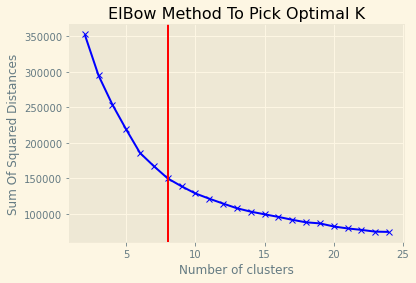

In [221]:
Sum_of_squared_distances = []

K = range(2, 25)

for k in K:
    kmeans = KMeans(n_clusters = k).fit(df_robust_pca)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.title('ElBow Method To Pick Optimal K')
plt.xlabel('Number of clusters')
plt.ylabel('Sum Of Squared Distances')
plt.axvline(x=8, color="red")
plt.show()

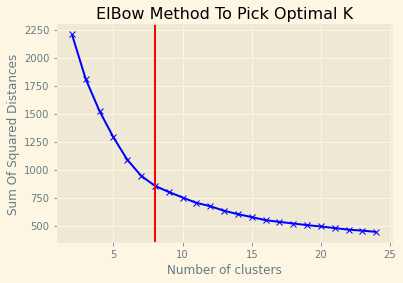

In [222]:
Sum_of_squared_distances = []

K = range(2, 25)

for k in K:
    kmeans = KMeans(n_clusters = k).fit(df_robust_kpca)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.title('ElBow Method To Pick Optimal K')
plt.xlabel('Number of clusters')
plt.ylabel('Sum Of Squared Distances')
plt.axvline(x=8, color="red")
plt.show()

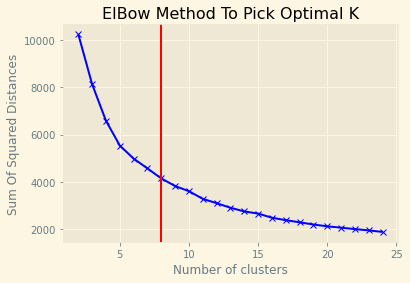

In [223]:
Sum_of_squared_distances = []

K = range(2, 25)

for k in K:
    kmeans = KMeans(n_clusters = k).fit(df_quantile_pca)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.title('ElBow Method To Pick Optimal K')
plt.xlabel('Number of clusters')
plt.ylabel('Sum Of Squared Distances')
plt.axvline(x=8, color="red")
plt.show()

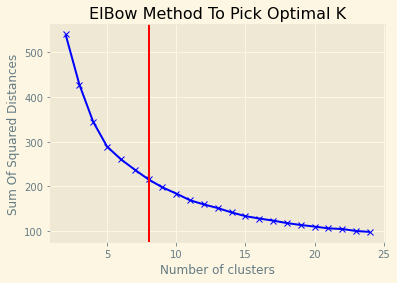

In [224]:
Sum_of_squared_distances = []

K = range(2, 25)

for k in K:
    kmeans = KMeans(n_clusters = k).fit(df_quantile_kpca)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.title('ElBow Method To Pick Optimal K')
plt.xlabel('Number of clusters')
plt.ylabel('Sum Of Squared Distances')
plt.axvline(x=8, color="red")
plt.show()

> K = 8 (8 clusters)

##### t-SNE 

In [225]:
tsne_projection = TSNE(n_jobs=-1, random_state=42).fit_transform(robust_df)

##### Apply Kmeans and t-SNE

In [226]:
kmeans = KMeans(n_clusters=8,  random_state=0)
labels = kmeans.fit_predict(df_robust_pca)

tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels

In [227]:
tsne_projection['cluster'].value_counts().sort_values(ascending=True)

4       7
5      22
3      82
6     502
0     887
1    1055
7    1203
2    4878
Name: cluster, dtype: int64

In [228]:
px.scatter(tsne_projection, x='X', y='Y', color='cluster')


In [229]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, kmeans.labels_, metric='euclidean')))

Score: 0.338


##### **2- Hierarchical Clustering**

###### (2-A) Single Linkage

In [230]:
clustering = AgglomerativeClustering(n_clusters=8, linkage='single').fit(df_robust_pca)
labels = clustering.labels_

tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = clustering.labels_

px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [231]:
tsne_projection['cluster'].value_counts().sort_values(ascending=True)

6       1
7       1
3       1
5       1
2       1
4       1
1       1
0    8629
Name: cluster, dtype: int64

In [232]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, clustering.labels_, metric='euclidean')))

Score: 0.845


###### (2-B) Complete Linkage

In [233]:
clustering = AgglomerativeClustering(n_clusters=8, linkage='complete').fit(df_robust_pca)
labels = clustering.labels_

tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = clustering.labels_

px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [234]:
tsne_projection['cluster'].value_counts().sort_values(ascending=True)

7       1
6       1
5       4
2       6
3      11
0      18
4      32
1    8563
Name: cluster, dtype: int64

In [235]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, clustering.labels_, metric='euclidean')))

Score: 0.781


###### (2-C) Ward Linkage

In [236]:
clustering = AgglomerativeClustering(n_clusters=8, linkage='ward').fit(df_robust_pca)
labels = clustering.labels_

tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = clustering.labels_

px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [237]:
tsne_projection['cluster'].value_counts().sort_values(ascending=True)

7       7
5      23
4      58
6     135
2     156
3    1255
1    1948
0    5054
Name: cluster, dtype: int64

In [238]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, clustering.labels_, metric='euclidean')))

Score: 0.291


###### (2-D) Average Linkage

In [239]:
clustering = AgglomerativeClustering(n_clusters=8, linkage='average').fit(df_robust_pca)
labels = clustering.labels_

tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = clustering.labels_

px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [240]:
tsne_projection['cluster'].value_counts().sort_values(ascending=True)

6       1
5       1
7       1
4       3
3       4
1      17
2      21
0    8588
Name: cluster, dtype: int64

In [241]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, clustering.labels_, metric='euclidean')))

Score: 0.824


##### 3- DBSCAN

<span><b>Epsilon = 0.8</b></span>

In [242]:
dbscan = DBSCAN(eps=3, min_samples=4).fit(df_robust_pca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [243]:
tsne_projection['cluster'].value_counts().sort_values(ascending=False)

 0    8365
-1     248
 1      11
 3       5
 2       4
 4       3
Name: cluster, dtype: int64

In [244]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, labels)))

Score: 0.530


<span><b>Epsilon = 5</b></span>

In [245]:
dbscan = DBSCAN(eps=5, min_samples=5).fit(df_robust_pca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [246]:
tsne_projection['cluster'].value_counts().sort_values(ascending=False)

 0    8543
-1      82
 1      11
Name: cluster, dtype: int64

In [247]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, labels)))

Score: 0.806


<span><b>Epsilon = 8</b></span>

In [248]:
dbscan = DBSCAN(eps=8, min_samples=5).fit(df_robust_pca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [249]:
tsne_projection['cluster'].value_counts().sort_values(ascending=False)

 0    8590
-1      46
Name: cluster, dtype: int64

In [250]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, labels)))

Score: 0.853


<span><b>Epsilon = 10</b></span>

In [251]:
dbscan = DBSCAN(eps=10, min_samples=5).fit(df_robust_pca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [252]:
tsne_projection['cluster'].value_counts().sort_values(ascending=False)

 0    8600
-1      30
 1       6
Name: cluster, dtype: int64

In [253]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, labels)))

Score: 0.831


<span><b>Epsilon = 15</b></span>

In [254]:
dbscan = DBSCAN(eps=15, min_samples=5).fit(df_robust_pca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [255]:
tsne_projection['cluster'].value_counts().sort_values(ascending=False)

 0    8617
-1      19
Name: cluster, dtype: int64

In [256]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, labels)))

Score: 0.883


###### Epsilon = 4, min_samples = 5, 8, 10

In [257]:
dbscan = DBSCAN(eps=4, min_samples=5).fit(df_robust_pca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [258]:
dbscan = DBSCAN(eps=4, min_samples=8).fit(df_robust_pca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [259]:
dbscan = DBSCAN(eps=4, min_samples=10).fit(df_robust_pca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

##### Scaled Kernal PCA

##### 1- Kmeans

In [260]:
kmeans = KMeans(n_clusters=8,  random_state=0)
labels = kmeans.fit_predict(df_robust_kpca)

tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color='cluster')

In [261]:
tsne_projection['cluster'].value_counts()

4    2038
3    1302
0    1060
7    1059
1    1046
2     891
5     772
6     468
Name: cluster, dtype: int64

In [262]:
print("Score: {:.3f}".format(silhouette_score(df_robust_kpca, kmeans.labels_, metric='euclidean')))

Score: 0.337


##### Hierarchical clustering

###### Single Linkage

In [263]:
clustering = AgglomerativeClustering(n_clusters=8, linkage='single').fit(df_robust_kpca)
labels = clustering.labels_

tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = clustering.labels_

px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [264]:
tsne_projection['cluster'].value_counts().sort_values(ascending=False)

0    8628
2       2
5       1
4       1
6       1
7       1
3       1
1       1
Name: cluster, dtype: int64

In [265]:
print("Score: {:.3f}".format(silhouette_score(df_robust_kpca, clustering.labels_, metric='euclidean')))

Score: -0.236


###### Ward Linkage

In [266]:
clustering = AgglomerativeClustering(n_clusters=8, linkage='ward').fit(df_robust_kpca)
labels = clustering.labels_

tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = clustering.labels_

px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [267]:
tsne_projection['cluster'].value_counts().sort_values(ascending=False)

1    2187
0    1597
5    1184
2     976
4     920
3     809
6     489
7     474
Name: cluster, dtype: int64

In [268]:
print("Score: {:.3f}".format(silhouette_score(df_robust_kpca, clustering.labels_, metric='euclidean')))

Score: 0.277


##### DBSCAN

In [269]:
dbscan = DBSCAN(eps=0.15, min_samples=10).fit(df_robust_kpca)
labels = dbscan.labels_
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['cluster'] = labels
px.scatter(tsne_projection, x='X', y='Y', color="cluster")

In [270]:
tsne_projection['cluster'].value_counts().sort_values(ascending=False)

 0    7488
-1    1039
 1      37
 4      25
 2      24
 3      13
 5      10
Name: cluster, dtype: int64

In [271]:
print("Score: {:.3f}".format(silhouette_score(df_robust_kpca, dbscan.labels_, metric='euclidean')))

Score: -0.276


##### Isolated Random Forest

In [272]:
IRF = IsolationForest(random_state=42, bootstrap=True, n_jobs=-1).fit(df_robust_pca)
y_pred = IRF.predict(df_robust_pca)

In [273]:
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'], index=data.index.tolist())
tsne_projection['Prediction'] = (y_pred).tolist()
px.scatter(tsne_projection, x='X', y='Y', color="Prediction")

In [274]:
tsne_projection['Prediction'].value_counts(sort=True)

 1    7951
-1     685
Name: Prediction, dtype: int64

In [275]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, y_pred, metric='euclidean')))

Score: 0.582


##### EM

In [276]:
em = GaussianMixture(n_components=8, random_state=42).fit(df_robust_pca)
y_pred = em.predict(df_robust_pca)

In [277]:
tsne_projection = pd.DataFrame(tsne_projection, columns=['X', 'Y'],index=data.index.tolist())
tsne_projection['Prediction'] = (y_pred).tolist()

px.scatter(tsne_projection, x='X', y='Y', color="Prediction")


In [278]:
tsne_projection['Prediction'].value_counts(sort=True)

4    1960
1    1568
2    1304
0     959
7     865
5     741
3     721
6     518
Name: Prediction, dtype: int64

In [279]:
print("Score: {:.3f}".format(silhouette_score(df_robust_pca, y_pred, metric='euclidean')))

Score: -0.051
